https://www.kaggle.com/code/nitishmallick/restaurant-recommendation-system-yelp-dataset 
restaurant recommendation system (maybe implement?)

In [1]:
import json
import typing
import folium

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from collections import Counter
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer


In [2]:
sample_size = 10000

In [3]:
def json_to_df(path):
    with open(path) as data_file:
        data = []
        for line in data_file:
            data.append(json.loads(line))
    df = pd.DataFrame(data)
    return df

def count_unique_items(row):
    return len(set(row))

In [4]:
df_business = json_to_df("./data/yelp_academic_dataset_business.json")
df_checkin = json_to_df("./data/yelp_academic_dataset_checkin.json")
df_review = json_to_df("./data/yelp_academic_dataset_review.json")
df_tip = json_to_df("./data/yelp_academic_dataset_tip.json")
df_user = json_to_df("./data/yelp_academic_dataset_user.json")

# Initial Analysis

## Analysis of Business Data

In [5]:
df_business.head(3)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."


In [6]:
m = folium.Map(location=[40.479627, -99.396414], tiles="cartodbpositron", zoom_start=4)
mc = MarkerCluster()

for idx, row in df_business.sample(sample_size).iterrows():
    mc.add_child(Marker([row['latitude'], row['longitude']]))
m.add_child(mc)
m

In [7]:
b_unique_count = {col_name: len(df_business[col_name].unique()) for col_name in ['city', 'state', 'postal_code', 'stars', 'is_open']}
print(f"Unique values for a selection of columns:\n{b_unique_count} \n")

Unique values for a selection of columns:
{'city': 1416, 'state': 27, 'postal_code': 3362, 'stars': 9, 'is_open': 2} 



In [8]:
print("Number of McDonald's:")
list_of_mcd = []
for idx, row in df_business.iterrows():
    if "McDonald" in row['name']:
        list_of_mcd.append(row["name"])
dict(Counter(list_of_mcd))

Number of McDonald's:


{"McDonald's": 703,
 'McDonald’s': 1,
 'McDonalds': 5,
 "McDonalds's": 1,
 'Ronald McDonald House': 3,
 'Philadelphia Ronald McDonald House': 1,
 'McDonald Park': 1,
 'McDonald Pest Control': 1,
 'Max McDonald Surfboard Repair': 1}

## Analysis of Reviews

In [9]:
df_review.head(3)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5.0,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3.0,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30


In [10]:
avg_review_len = df_review['text'].str.len().mean()
print(f"Avg review length: {avg_review_len:.2f}")

Avg review length: 567.76


In [11]:
sampled_data = df_review['text'].sample(sample_size)

word_vectorizer = CountVectorizer(ngram_range=(1, 1), analyzer='word')
sparse_matrix = word_vectorizer.fit_transform(sampled_data)

feature_names = word_vectorizer.get_feature_names_out()
frequencies = sparse_matrix.sum(axis=0).A1

n_grams = pd.DataFrame({'frequency': frequencies}, index=feature_names)
print(n_grams.sort_values(by="frequency", ascending=False))

                   frequency
the                    52892
and                    37643
to                     25423
was                    19442
it                     15481
...                      ...
jalisco                    1
jaloff                     1
jamaicanchocolate          1
jamawn                     1
麻婆豆腐                       1

[25752 rows x 1 columns]


## Analysis of Tip Data

In [12]:
df_tip.head(5)

,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0


## Analysis of User Data

In [13]:
df_user.head(3)

,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18


User count: 1987897
Average review count: 23.39


Text(0.5, 0, 'Review Count')

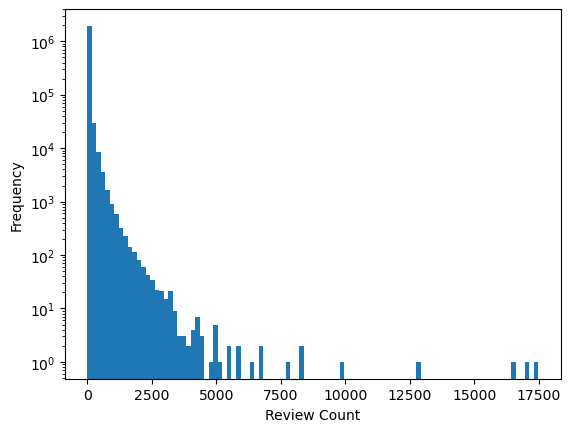

In [14]:
print(f"User count: {len(df_user)}")

avg_review_count = df_user["review_count"].mean()
print(f"Average review count: {avg_review_count:.2f}")

ax = df_user['review_count'].plot.hist(bins=100, log=True)
ax.set_xlabel("Review Count")

# Further Analysis

In [15]:
filter_criterion = "Restaurants"

In [16]:
df_business.head(3)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."


In [17]:
category_container = []
for _, row in df_business.iterrows():
    categories = row["categories"]
    if categories != None:
        split_row = [category.strip() for category in categories.split(",")]
        for item in split_row:
            category_container.append(item)

unique_categorie_count = dict(Counter(category_container))
unique_categorie_count = dict(sorted(unique_categorie_count.items(), key=lambda item: item[1], reverse=True))
unique_categorie_count

{'Restaurants': 52268,
 'Food': 27781,
 'Shopping': 24395,
 'Home Services': 14356,
 'Beauty & Spas': 14292,
 'Nightlife': 12281,
 'Health & Medical': 11890,
 'Local Services': 11198,
 'Bars': 11065,
 'Automotive': 10773,
 'Event Planning & Services': 9895,
 'Sandwiches': 8366,
 'American (Traditional)': 8139,
 'Active Life': 7687,
 'Pizza': 7093,
 'Coffee & Tea': 6703,
 'Fast Food': 6472,
 'Breakfast & Brunch': 6239,
 'American (New)': 6097,
 'Hotels & Travel': 5857,
 'Home & Garden': 5799,
 'Fashion': 5739,
 'Burgers': 5636,
 'Arts & Entertainment': 5434,
 'Auto Repair': 5433,
 'Hair Salons': 5046,
 'Nail Salons': 4621,
 'Mexican': 4600,
 'Italian': 4573,
 'Specialty Food': 4233,
 'Doctors': 3763,
 'Pets': 3758,
 'Real Estate': 3577,
 'Seafood': 3539,
 'Fitness & Instruction': 3293,
 'Professional Services': 3270,
 'Hair Removal': 3239,
 'Desserts': 3186,
 'Chinese': 3169,
 'Bakeries': 3150,
 'Grocery': 3139,
 'Salad': 3064,
 'Hotels': 2977,
 'Chicken Wings': 2966,
 'Cafes': 2756,
 '

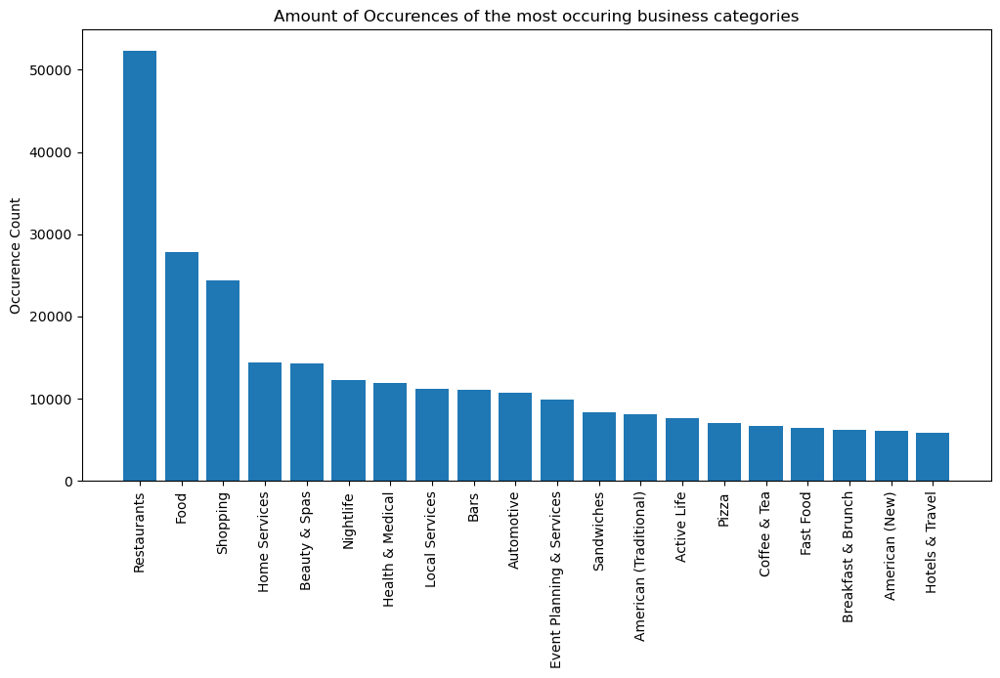

In [18]:
top_20_categories = list(unique_categorie_count.items())[:20]

# Separate the keys and values from the tuples
keys, values = zip(*top_20_categories)

# Create a barplot
plt.figure(figsize=(12, 6))
plt.bar(keys, values)
plt.ylabel('Occurence Count')
plt.title('Amount of Occurences of the most occuring business categories')
plt.xticks(rotation=90)
plt.show()

In [19]:
df_business_no_na = df_business.dropna()
df_filtered = df_business_no_na[df_business_no_na["categories"].str.contains(filter_criterion)].reset_index()
df_filtered

,index,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
1,5,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '..."
2,9,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ''casual'', 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '..."
3,11,eEOYSgkmpB90uNA7lDOMRA,Vietnamese Food Truck,,Tampa Bay,FL,33602,27.955269,-82.456320,4.0,10,1,"{'Alcohol': ''none'', 'OutdoorSeating': 'None'...","Vietnamese, Food, Restaurants, Food Trucks","{'Monday': '11:0-14:0', 'Tuesday': '11:0-14:0'..."
4,12,il_Ro8jwPlHresjw9EGmBg,Denny's,8901 US 31 S,Indianapolis,IN,46227,39.637133,-86.127217,2.5,28,1,"{'RestaurantsReservations': 'False', 'Restaura...","American (Traditional), Restaurants, Diners, B...","{'Monday': '6:0-22:0', 'Tuesday': '6:0-22:0', ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44671,150325,l9eLGG9ZKpLJzboZq-9LRQ,Wawa,19 N Bishop Ave,Clifton Heights,PA,19018,39.925656,-75.310344,3.0,11,1,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Restaurants, Sandwiches, Convenience Stores, C...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
44672,150327,cM6V90ExQD6KMSU3rRB5ZA,Dutch Bros Coffee,1181 N Milwaukee St,Boise,ID,83704,43.615401,-116.284689,4.0,33,1,"{'WiFi': ''free'', 'RestaurantsGoodForGroups':...","Cafes, Juice Bars & Smoothies, Coffee & Tea, R...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-17:0', '..."
44673,150336,WnT9NIzQgLlILjPT0kEcsQ,Adelita Taqueria & Restaurant,1108 S 9th St,Philadelphia,PA,19147,39.935982,-75.158665,4.5,35,1,"{'WheelchairAccessible': 'False', 'Restaurants...","Restaurants, Mexican","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."
44674,150339,2O2K6SXPWv56amqxCECd4w,The Plum Pit,4405 Pennell Rd,Aston,DE,19014,39.856185,-75.427725,4.5,14,1,"{'RestaurantsDelivery': 'False', 'BusinessAcce...","Restaurants, Comfort Food, Food, Food Trucks, ...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."


In [20]:
m_filtered = folium.Map(location=[40.479627, -99.396414], tiles='cartodbpositron', zoom_start=4)
mc_filtered = MarkerCluster()

for idx, row in df_filtered.iterrows():
    mc_filtered.add_child(Marker([row['latitude'], row['longitude']]))
m_filtered.add_child(mc_filtered)
m_filtered

In [21]:
unique_name_count = dict(Counter(df_filtered["name"]))
unique_name_count = dict(sorted(unique_name_count.items(), key=lambda item: item[1], reverse=True))
unique_name_count

{"McDonald's": 676,
 'Subway': 420,
 'Taco Bell': 353,
 'Burger King': 312,
 "Wendy's": 308,
 'Wawa': 299,
 "Domino's Pizza": 292,
 'Pizza Hut': 245,
 "Jimmy John's": 173,
 'KFC': 170,
 'Chick-fil-A': 159,
 "Dunkin'": 155,
 'Popeyes Louisiana Kitchen': 150,
 'Chipotle Mexican Grill': 147,
 'Starbucks': 143,
 'Panera Bread': 113,
 'Sonic Drive-In': 112,
 "Applebee's Grill + Bar": 112,
 'Panda Express': 108,
 'IHOP': 106,
 'Waffle House': 103,
 'Jack in the Box': 99,
 "Papa John's Pizza": 93,
 "Jersey Mike's Subs": 92,
 'Five Guys': 92,
 'Steak ’n Shake': 91,
 'QDOBA Mexican Eats': 81,
 'Dairy Queen': 81,
 'Dairy Queen Grill & Chill': 79,
 "Chili's": 78,
 "Denny's": 75,
 "Hardee's": 75,
 'Wingstop': 71,
 'Firehouse Subs': 68,
 'Buffalo Wild Wings': 64,
 'First Watch': 60,
 'Checkers': 59,
 'White Castle': 57,
 'PrimoHoagies': 56,
 'Outback Steakhouse': 55,
 'Saladworks': 54,
 'QuikTrip': 51,
 "Marco's Pizza": 50,
 'Boston Market': 50,
 "Church's Chicken": 48,
 "Culver's": 48,
 'China Wok

# Word Cloud Analysis

In [22]:
df_joined_review_user = pd.merge(df_review, df_user, on="user_id", how="inner")
df_joined_review_user_business = pd.merge(df_joined_review_user, df_business, on="business_id", how="inner").dropna()
df_joined_review_user_business.head(5)

,review_id,user_id,business_id,stars_x,useful_x,funny_x,cool_x,text,date,name_x,...,state,postal_code,latitude,longitude,stars_y,review_count_y,is_open,attributes,categories,hours
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,Melanie,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
1,jHmqmoEI-78BGHFJaDKlhQ,5EGs7LX3Z8ZogvOOgNLsnA,XQfwVwDr-v0ZS3_CbbE5Xw,2.0,0,0,0,"Excellent food but slow, slow, slow. Staff nee...",2017-10-09 15:55:09,Phyllis,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
2,vwIXZHod-jQmGFvx0wCqSg,q3Kv3wFOwu1Rd2I6T_VWOQ,XQfwVwDr-v0ZS3_CbbE5Xw,5.0,0,0,0,"After reading a ton of mixed reviews, my fianc...",2018-04-21 17:39:31,Gabby,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
3,SP32nOhRm-KRAjYMPgf_MQ,wmqsehbFirZPlAluJUakeQ,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,Stopped in for lunch on a Sat afternoon and lu...,2019-08-25 18:26:43,Charles,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
4,fvu5n5shkAJDbQjulKNuqw,NMLvjdY7IOdtfU0TepvUuA,XQfwVwDr-v0ZS3_CbbE5Xw,2.0,8,0,0,I really wanted to love this restaurant. The ...,2017-05-30 13:24:32,Zach,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."


In [23]:
df_joined_review_user_business_filtered = df_joined_review_user_business[df_joined_review_user_business["categories"].str.contains(filter_criterion)]
df_joined_review_user_business_filtered

,review_id,user_id,business_id,stars_x,useful_x,funny_x,cool_x,text,date,name_x,...,state,postal_code,latitude,longitude,stars_y,review_count_y,is_open,attributes,categories,hours
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,Melanie,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
1,jHmqmoEI-78BGHFJaDKlhQ,5EGs7LX3Z8ZogvOOgNLsnA,XQfwVwDr-v0ZS3_CbbE5Xw,2.0,0,0,0,"Excellent food but slow, slow, slow. Staff nee...",2017-10-09 15:55:09,Phyllis,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
2,vwIXZHod-jQmGFvx0wCqSg,q3Kv3wFOwu1Rd2I6T_VWOQ,XQfwVwDr-v0ZS3_CbbE5Xw,5.0,0,0,0,"After reading a ton of mixed reviews, my fianc...",2018-04-21 17:39:31,Gabby,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
3,SP32nOhRm-KRAjYMPgf_MQ,wmqsehbFirZPlAluJUakeQ,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,Stopped in for lunch on a Sat afternoon and lu...,2019-08-25 18:26:43,Charles,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
4,fvu5n5shkAJDbQjulKNuqw,NMLvjdY7IOdtfU0TepvUuA,XQfwVwDr-v0ZS3_CbbE5Xw,2.0,8,0,0,I really wanted to love this restaurant. The ...,2017-05-30 13:24:32,Zach,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6989002,KGGmdnl_BsZcfh3nKzMiMg,GDacE76DjPsi00My-O24Uw,p8XlrG4bn8zkEZBJTendLA,5.0,0,0,0,The food here is always fresh and delicious. I...,2022-01-15 14:13:15,Deanna,...,PA,19027,40.071565,-75.126619,5.0,5,1,"{'RestaurantsDelivery': 'True', 'OutdoorSeatin...","Restaurants, Sandwiches, Cheesesteaks, Breakfa...","{'Wednesday': '9:15-14:15', 'Thursday': '9:15-..."
6989003,0w7tSTLDzHEJ3qlrBuXM9Q,EmZRW8SnFiCiayGKp66M-w,p8XlrG4bn8zkEZBJTendLA,5.0,0,0,0,I wanted to say thank you so much! The food wa...,2022-01-17 01:14:43,Tijuanda,...,PA,19027,40.071565,-75.126619,5.0,5,1,"{'RestaurantsDelivery': 'True', 'OutdoorSeatin...","Restaurants, Sandwiches, Cheesesteaks, Breakfa...","{'Wednesday': '9:15-14:15', 'Thursday': '9:15-..."
6989004,8rgV1yO1Rp67ImFXqX-1nw,T83Wq9USrS6rQbOX4svttQ,p8XlrG4bn8zkEZBJTendLA,5.0,0,0,0,"We've driven from DC, multiple times since FCK...",2022-01-17 21:43:40,L,...,PA,19027,40.071565,-75.126619,5.0,5,1,"{'RestaurantsDelivery': 'True', 'OutdoorSeatin...","Restaurants, Sandwiches, Cheesesteaks, Breakfa...","{'Wednesday': '9:15-14:15', 'Thursday': '9:15-..."
6989005,e0ecH3HeNuZPoCzWUEmfsA,614lP-SROJUjlbrqfoXBRg,p8XlrG4bn8zkEZBJTendLA,5.0,0,0,0,I've had breakfast and lunch at foodchasers an...,2022-01-19 04:32:04,Michelle,...,PA,19027,40.071565,-75.126619,5.0,5,1,"{'RestaurantsDelivery': 'True', 'OutdoorSeatin...","Restaurants, Sandwiches, Cheesesteaks, Breakfa...","{'Wednesday': '9:15-14:15', 'Thursday': '9:15-..."


In [30]:
text_data = df_joined_review_user_business_filtered.sample(sample_size)
text_data = text_data["text"].str.cat(sep=' ')

wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text_data)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

<class 'str'>


ValueError: Only supported for TrueType fonts